<a href="https://colab.research.google.com/github/RH-Pronoy/BlackList/blob/main/Pumpkin_DenseNet_121.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pandas pillow

In [4]:
!pip install pandas
!pip install opencv-python

In [1]:
!pip install tensorflow==2.12.0
!pip install keras

In [2]:
import numpy as np
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import os
from tensorflow import keras
import glob as gb
import pandas as pd
from tensorflow.keras.preprocessing import image_dataset_from_directory
# Import RandomFlip and RandomRotation from the preprocessing module
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPool2D, LeakyReLU

In [3]:
IMG_SIZE = (299, 299) # resolution
directory = "/content/drive/MyDrive/Bangladeshi Crop Diseases detection dataset/Dataset/Pumpkin Leaf Diseases Dataset From Bangladesh/Original Dataset"
BATCH_SIZE = 128
train_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             labels='inferred',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.1,
                                             subset='training',
                                             color_mode='rgb',
                                             seed=42)
validation_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             labels='inferred',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.1,
                                             subset='validation',
                                             color_mode='rgb',
                                             seed=42)

Found 2000 files belonging to 5 classes.
Using 1800 files for training.
Found 2000 files belonging to 5 classes.
Using 200 files for validation.


In [4]:
class_names = train_dataset.class_names
class_names

['Bacterial Leaf Spot',
 'Downy Mildew',
 'Healthy Leaf',
 'Mosaic Disease',
 'Powdery_Mildew']

<ipython-input-5-1da483e338f0>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['Bacterial Leaf Spot',


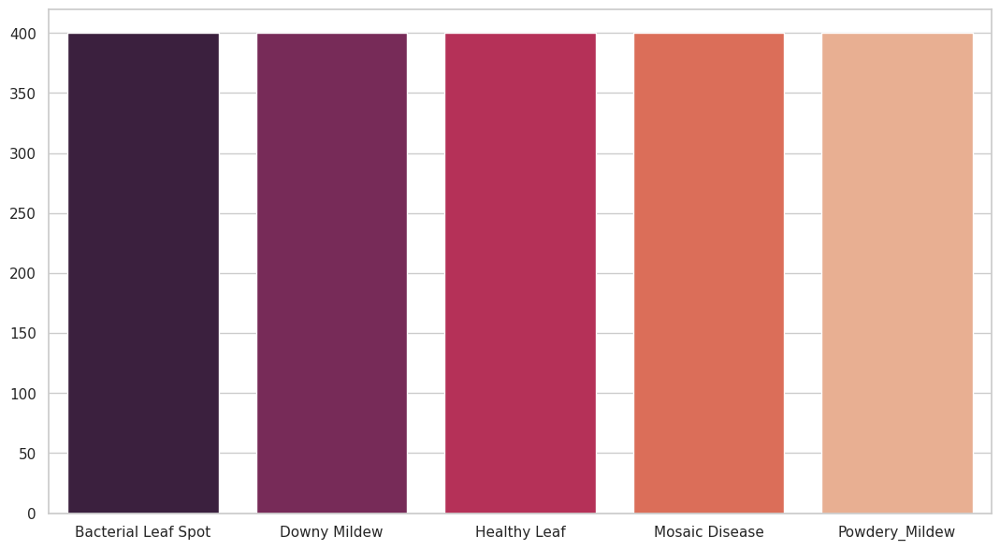

In [5]:
sns.set_theme(style="whitegrid")
Data_imbalance = []
for folder in os.listdir(directory):
    files = gb.glob(pathname=str(directory + "/" + folder +"/*.*"))
    Data_imbalance.append(len(files))
plt.figure(figsize=(13,7))
sns.barplot(x=['Bacterial Leaf Spot',
 'Downy Mildew',
 'Healthy Leaf',
 'Mosaic Disease',
 'Powdery_Mildew'], y=Data_imbalance, palette="rocket")
plt.show()

In [6]:
total = 0
for i in range(0,len(Data_imbalance)) :
    total +=Data_imbalance[i]

weight_for_0 = (1 / Data_imbalance[0]) * (total / 4.0)
weight_for_1 = (1 / Data_imbalance[1]) * (total / 4.0)
weight_for_2 = (1 / Data_imbalance[2]) * (total / 4.0)
weight_for_3 = (1 / Data_imbalance[3]) * (total / 4.0)
weight_for_4 = (1 / Data_imbalance[3]) * (total / 4.0)

class_weight = {0: weight_for_0, 1: weight_for_1, 2: weight_for_2, 3: weight_for_3, 4: weight_for_4}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))
print('Weight for class 2: {:.2f}'.format(weight_for_2))
print('Weight for class 3: {:.2f}'.format(weight_for_3))
print('Weight for class 4: {:.2f}'.format(weight_for_4))


Weight for class 0: 1.25
Weight for class 1: 1.25
Weight for class 2: 1.25
Weight for class 3: 1.25
Weight for class 4: 1.25


In [7]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal"),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  tf.keras.layers.RandomHeight(0.2),
  tf.keras.layers.RandomWidth(0.2),
])

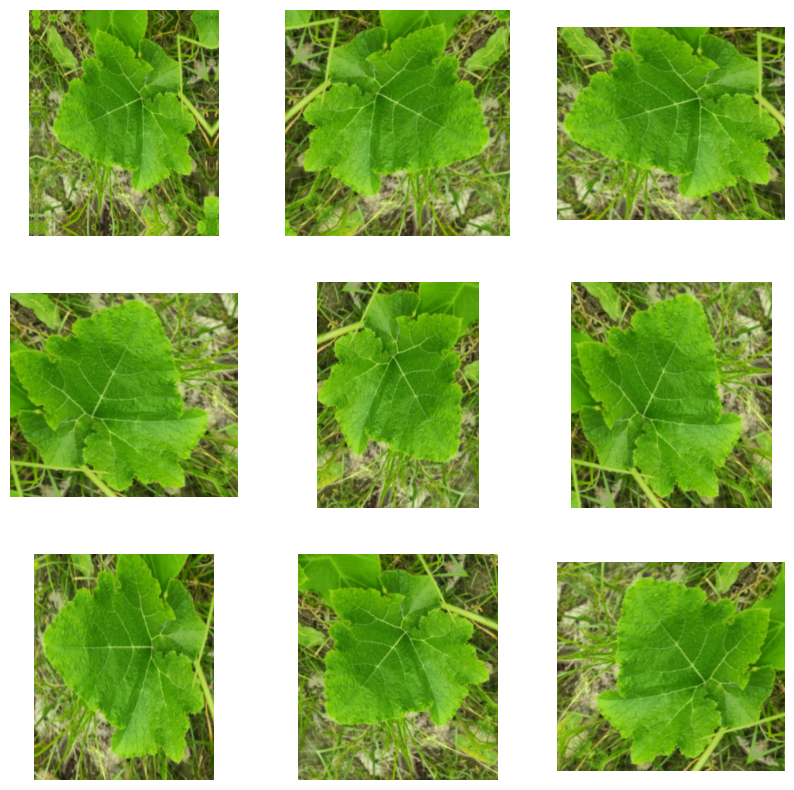

In [8]:
for image, _ in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')

**Bacterial Leaf Spot**

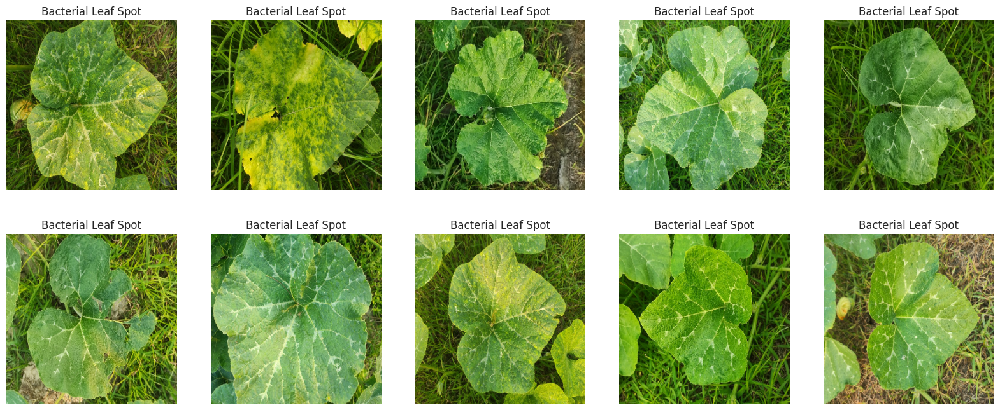

In [9]:
plt.figure(figsize=(20,8))
Bacterial_Leaf_Spot = []
Downy_Mildew = []
Mosaic_Disease =[]
Powdery_Mildew =[]

for images , labels in train_dataset.take(1):
    for i in range(100):
        if class_names[labels[i]] == "Bacterial Leaf Spot":
            Bacterial_Leaf_Spot.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Downy Mildew":
            Downy_Mildew.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Mosaic Disease":
            Mosaic_Disease.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Powdery_Mildew":
            Powdery_Mildew.append(images[i].numpy().astype("uint8"))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Bacterial_Leaf_Spot[i])
    plt.axis("off")
    plt.title("Bacterial Leaf Spot")

**Downy_Mildew**

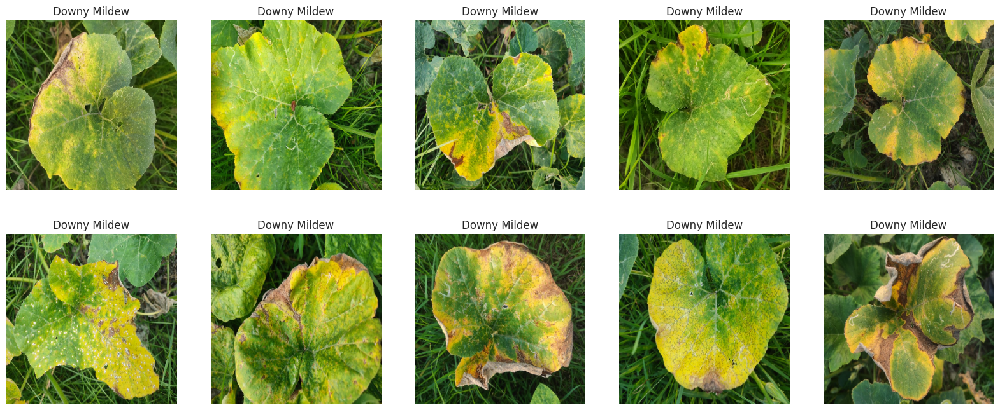

In [10]:
plt.figure(figsize=(20,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Downy_Mildew[i])
    plt.axis("off")
    plt.title("Downy Mildew")

**Mosaic_Disease**

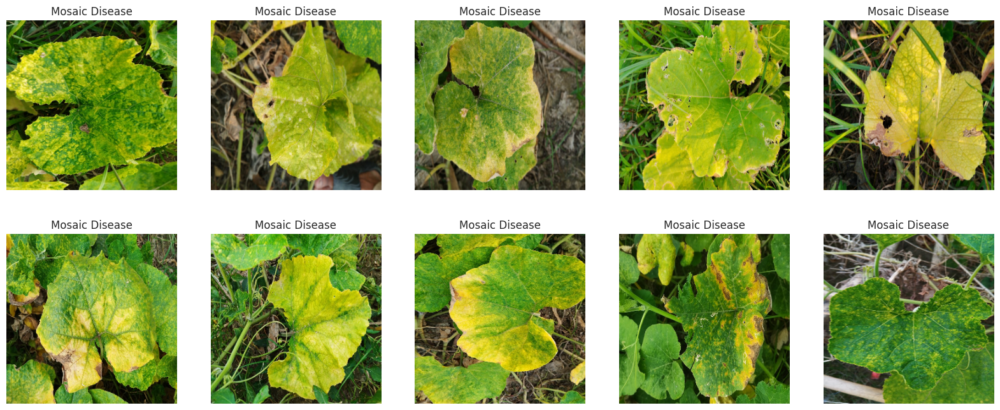

In [11]:
plt.figure(figsize=(20,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Mosaic_Disease[i])
    plt.axis("off")
    plt.title("Mosaic Disease")


**Powdery_Mildew**

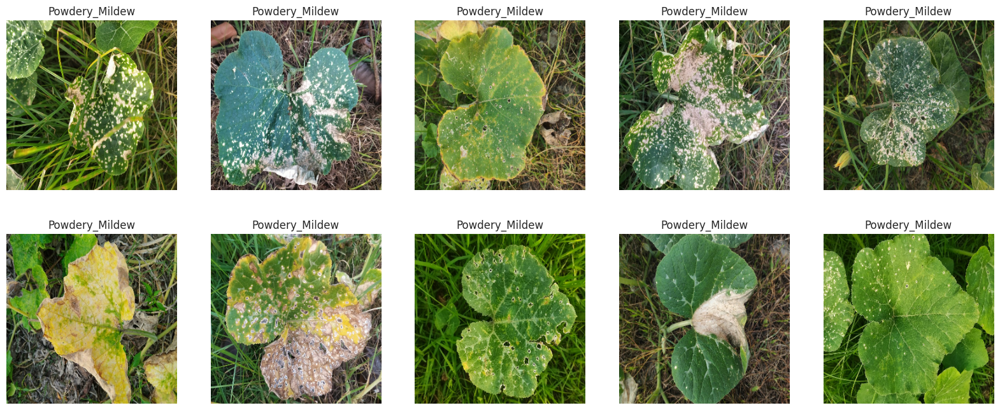

In [12]:
plt.figure(figsize=(20,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Powdery_Mildew[i])
    plt.axis("off")
    plt.title("Powdery_Mildew")


In [13]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

**Modeling**

In [14]:
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.DenseNet121(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')

29084464/29084464 [==============================] - 0s 0us/step


In [15]:
type(base_model)
preprocess_input = tf.keras.applications.densenet.preprocess_input

In [16]:
nb_layers = len(base_model.layers)
print("Number of Layers =", nb_layers)
print(base_model.layers[-2].name)  # Pre-last layer name
print(base_model.layers[-1].name)  # Last layer name

Number of Layers = 427
bn
relu


In [17]:
# Ensure base_model is a TensorFlow model and in inference mode
image_batch, label_batch = next(iter(train_dataset))  # Get a batch of images

# Run the base model on the batch to extract features
feature_batch = base_model(image_batch, training=False)

# Print the feature map shape
print("Feature batch shape:", feature_batch.shape)

Feature batch shape: (128, 9, 9, 1024)


**DenseNet 121**

In [25]:
import tensorflow as tf

def plant_leaf_model(image_shape=IMG_SIZE, num_classes=5):
    """Define a tf.keras model using DenseNet121 for multi-class classification."""
    image_shape = image_shape + (3,)  # Ensure input shape includes color channels

    # Load the DenseNet121 model (pretrained on ImageNet) without the top layer
    base_model = tf.keras.applications.DenseNet121(input_shape=image_shape, include_top=False, weights='imagenet')

    # Set all layers to trainable, but freeze the first few for transfer learning
    base_model.trainable = True
    for layer in base_model.layers[:300]:  # Freeze the first 300 layers
        layer.trainable = False

    # Define the model architecture
    inputs = tf.keras.Input(shape=image_shape)
    x = data_augmentation(inputs)  # Apply data augmentation
    x = preprocess_input(inputs)  # Apply preprocessing
    x = base_model(x, training=False)  # Extract features using DenseNet121
    x = tf.keras.layers.GlobalAveragePooling2D()(x)  # Global Average Pooling
    x = tf.keras.layers.Dropout(0.2)(x)  # Dropout for regularization
    prediction_layer = tf.keras.layers.Dense(num_classes, activation="softmax")  # Output layer (adjusted classes)
    outputs = prediction_layer(x)

    # Create the final model
    model = tf.keras.Model(inputs, outputs)
    model.summary()

    return model

# Automatically detect the number of classes
num_classes = len(class_names)  # Dynamically set the number of output classes

Plant_Leaf_Model = plant_leaf_model(IMG_SIZE, num_classes)


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 299, 299, 3)      0         
 da)                                                             
                                                                 
 tf.nn.bias_add_1 (TFOpLambd  (None, 299, 299, 3)      0         
 a)                                                              
                                                                 
 tf.math.truediv_3 (TFOpLamb  (None, 299, 299, 3)      0         
 da)                                                             
                                                                 
 densenet121 (Functional)    (None, 9, 9, 1024)        7037504   
                                                           

In [26]:
Plant_Leaf_Model = plant_leaf_model(IMG_SIZE)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 tf.math.truediv_4 (TFOpLamb  (None, 299, 299, 3)      0         
 da)                                                             
                                                                 
 tf.nn.bias_add_2 (TFOpLambd  (None, 299, 299, 3)      0         
 a)                                                              
                                                                 
 tf.math.truediv_5 (TFOpLamb  (None, 299, 299, 3)      0         
 da)                                                             
                                                                 
 densenet121 (Functional)    (None, 9, 9, 1024)        7037504   
                                                           

In [27]:
# Set a lower base learning rate
base_learning_rate = 0.0001  # Suggested: 1e-4 or 1e-3

# Compile the model
Plant_Leaf_Model.compile(
    optimizer=tf.keras.optimizers.Nadam(learning_rate=base_learning_rate),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

In [28]:
history = Plant_Leaf_Model.fit(
    train_dataset,
    epochs=10,
    class_weight=class_weight,
    validation_data=validation_dataset,
    verbose=1,  # Change to 1 for a cleaner output
    workers=-1,  # Use all available CPU cores for faster training
    use_multiprocessing=True  # Keep this for multi-core processing
)

Epoch 1/10
15/15 [==============================] - 693s 44s/step - loss: 1.4802 - accuracy: 0.5328 - val_loss: 1.4131 - val_accuracy: 0.4350
Epoch 2/10
15/15 [==============================] - 665s 44s/step - loss: 0.7854 - accuracy: 0.7728 - val_loss: 0.6579 - val_accuracy: 0.7950
Epoch 3/10
15/15 [==============================] - 675s 44s/step - loss: 0.5815 - accuracy: 0.8456 - val_loss: 0.6308 - val_accuracy: 0.7700
Epoch 4/10
15/15 [==============================] - 683s 45s/step - loss: 0.4768 - accuracy: 0.8661 - val_loss: 0.5552 - val_accuracy: 0.8450
Epoch 5/10
15/15 [==============================] - 693s 46s/step - loss: 0.4213 - accuracy: 0.8761 - val_loss: 0.6346 - val_accuracy: 0.8200
Epoch 6/10
15/15 [==============================] - 664s 44s/step - loss: 0.3713 - accuracy: 0.8978 - val_loss: 0.5763 - val_accuracy: 0.8150
Epoch 7/10
15/15 [==============================] - 709s 47s/step - loss: 0.3471 - accuracy: 0.9078 - val_loss: 0.5396 - val_accuracy: 0.8350
Epoch 

In [29]:
Plant_Leaf_Model.evaluate(validation_dataset , verbose = 1)

2/2 [==============================] - 56s 20s/step - loss: 0.7310 - accuracy: 0.7700


[0.73099684715271, 0.7699999809265137]

1/1 [==============================] - 0s 231ms/step


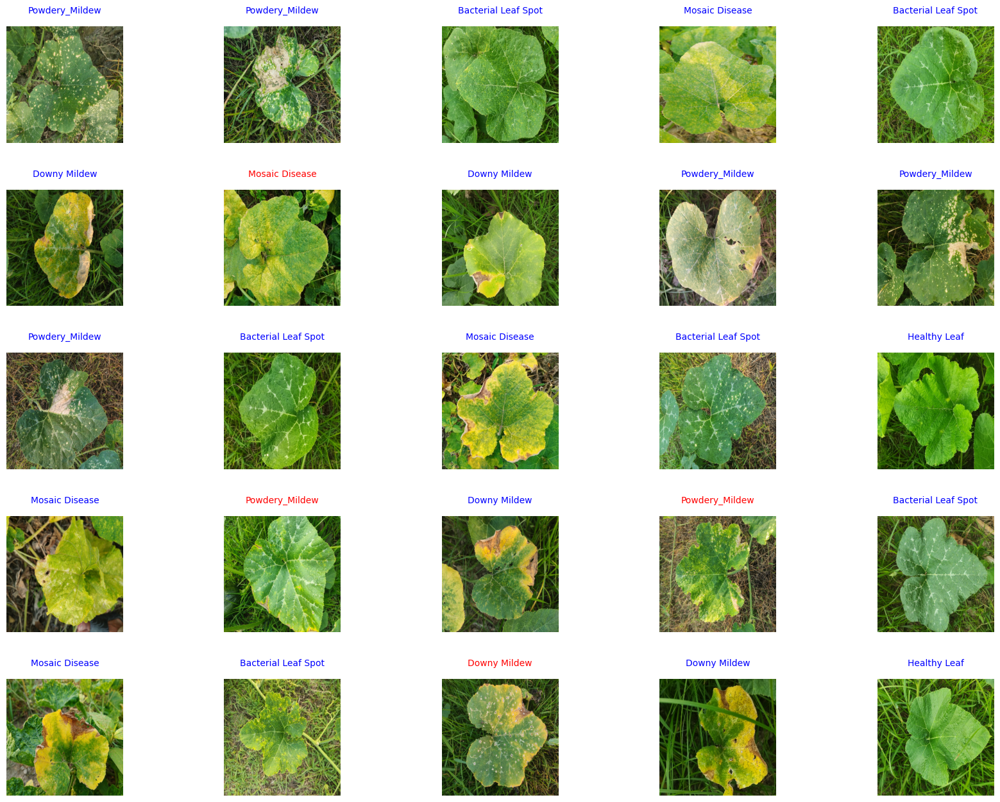

In [30]:
plt.figure(figsize=(20, 15))
for images, labels in train_dataset.take(1):
    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
        im2 = images[i].numpy().astype("uint8")
        img2 = tf.expand_dims(im2, 0)
        predict = Plant_Leaf_Model.predict(img2)
        predicted= class_names[np.argmax(predict)]
        actual = class_names [labels[i].numpy().astype("uint8")]
        if (actual == predicted):
            plt.title(predicted, fontsize=10, color= 'blue', pad=15);
        else :
            plt.title(actual, fontsize=10, color= 'red' ,pad=15);
        plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9,
                            top=0.9, wspace=0.4,hspace=0.4)

**Plotting Accuracy**

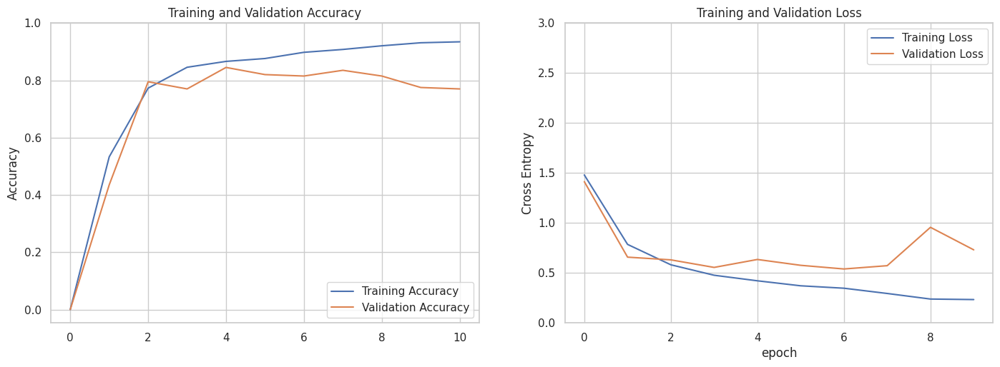

In [31]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(17, 12))
plt.subplot(2, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,3.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

3/3 [==============================] - 20s 5s/step


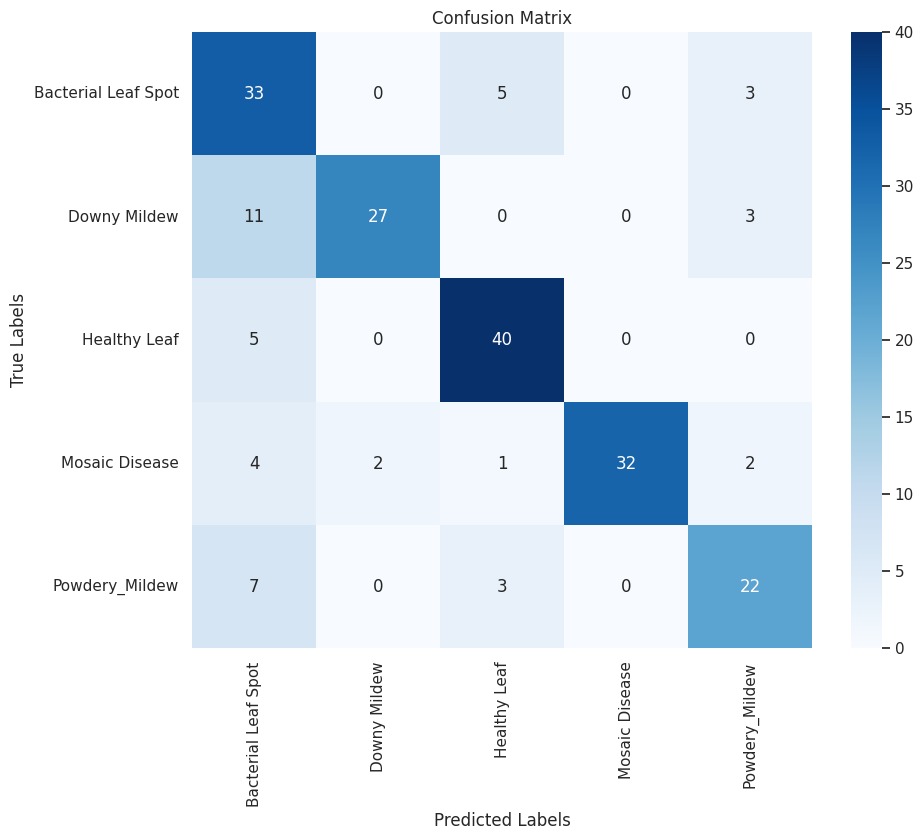

Confusion Matrix:
[[33  0  5  0  3]
 [11 27  0  0  3]
 [ 5  0 40  0  0]
 [ 4  2  1 32  2]
 [ 7  0  3  0 22]]


In [32]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Get the true labels and predicted labels
true_labels = []
predicted_labels = []

for images, labels in validation_dataset:
    predictions = Plant_Leaf_Model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)
    true_labels.extend(labels.numpy())
    predicted_labels.extend(predicted_classes)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Print confusion matrix separately
print("Confusion Matrix:")
print(conf_matrix)




In [33]:
# Print classification report separately
print("Classification Report:")
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print(report)

Classification Report:
                     precision    recall  f1-score   support

Bacterial Leaf Spot       0.55      0.80      0.65        41
       Downy Mildew       0.93      0.66      0.77        41
       Healthy Leaf       0.82      0.89      0.85        45
     Mosaic Disease       1.00      0.78      0.88        41
     Powdery_Mildew       0.73      0.69      0.71        32

           accuracy                           0.77       200
          macro avg       0.81      0.76      0.77       200
       weighted avg       0.81      0.77      0.78       200

